In [16]:
import numpy as np
import os
from PIL import Image
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score, recall_score, precision_score
from sklearn.metrics import confusion_matrix
import seaborn as sns
from tensorflow.keras.models import Model
import scipy  #Used to upsample our image


In [17]:
import tensorflow as tf

gpus = tf.config.experimental.list_physical_devices('GPU')
print(gpus)
if gpus:
  try:
    # Set the GPU as the default device
    tf.config.experimental.set_memory_growth(gpus[0], True)

    tf.config.experimental.set_visible_devices(gpus[0], 'GPU')

  except RuntimeError as e:
    print(e)

print('Memory:' ,tf.config.experimental.get_memory_info('GPU:0')['current'])

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Memory: 98945536


# Модель

#### **VGG16 модель предобученная на imagenet и дообученная на фотографиях меди** ####

In [25]:
model = tf.keras.models.load_model('models/cnn_128_epoch_100')

In [38]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 128, 128, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 128, 128, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 64, 64, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 64, 64, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 64, 64, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 32, 32, 128)       0     

# Prediction

In [20]:
defect_path = 'DATA/test/defect'
normal_path = 'DATA/test/normal'


def load_dataset(defect_path, normal_path):
    images_temp = []
    labels_temp = []
    size = 128

    for file in os.listdir(defect_path):
        img = Image.open(os.path.join(defect_path, file))
        img = img.resize((size, size))  
        img = np.array(img) / 255.0  
        images_temp.append(img)
        labels_temp.append(1)  

    for file in os.listdir(normal_path):
        img = Image.open(os.path.join(normal_path, file))
        img = img.resize((size, size))  
        img = np.array(img) / 255.0  
        images_temp.append(img)
        labels_temp.append(0) 

    return np.array(images_temp), np.array(labels_temp)

images_test, labels_test = load_dataset(defect_path, normal_path)

In [27]:
y_pred = np.argmax(model.predict(images_test), axis=1)

7/7 [==============================] - 1s 97ms/step


In [28]:
accuracy = accuracy_score(labels_test, y_pred)
print("Accuracy:", accuracy)

f1 = f1_score(labels_test, y_pred)
print("F1 Score:", f1)

recall = recall_score(labels_test, y_pred)
print("Recall:", recall)

precision = precision_score(labels_test, y_pred)
print("Precision:", precision)


Accuracy: 0.975
F1 Score: 0.9743589743589743
Recall: 0.95
Precision: 1.0


<Axes: >

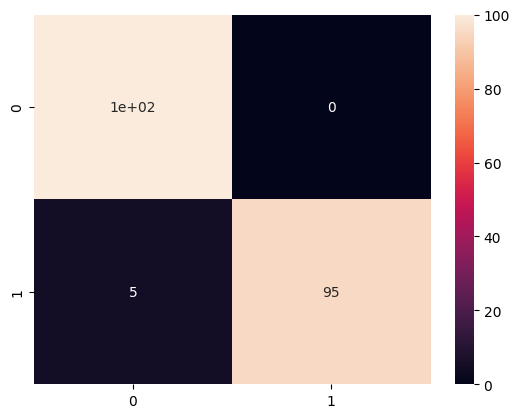

In [32]:


cm=confusion_matrix(labels_test, y_pred)  
sns.heatmap(cm, annot=True)

# RESULT PHOTOS

#### **DEFECTS** ####

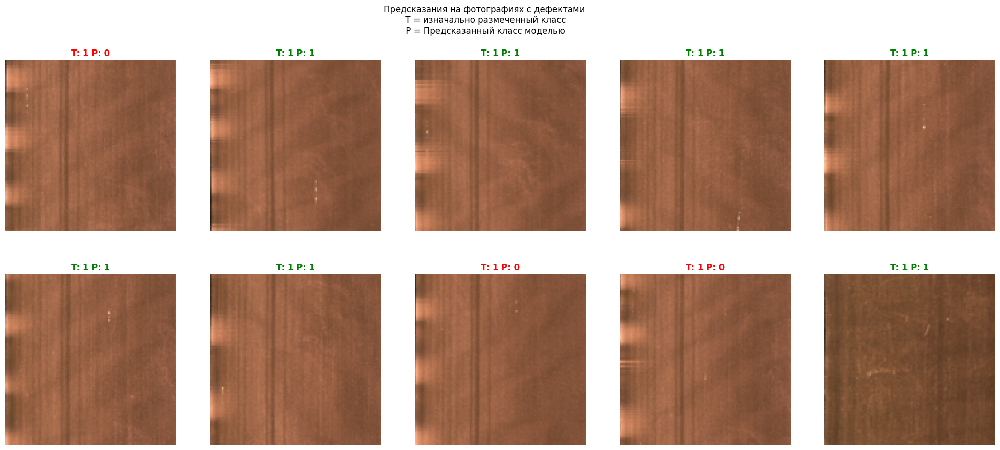

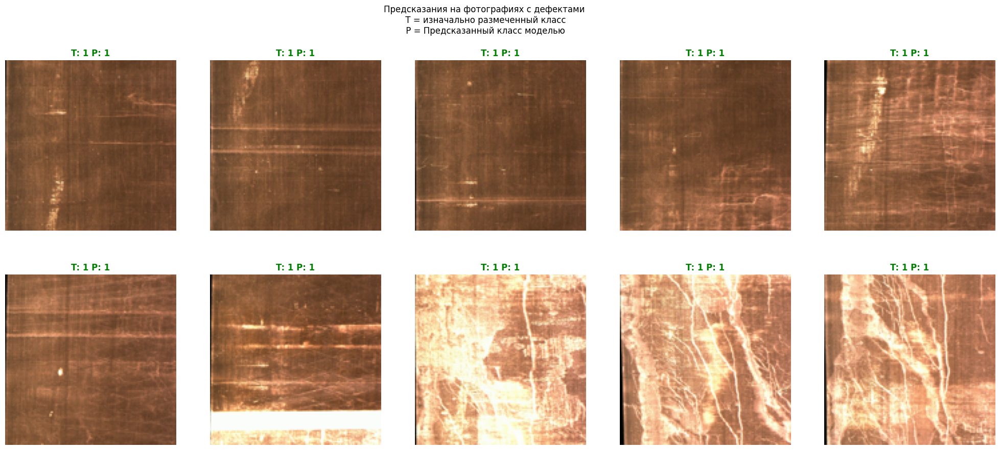

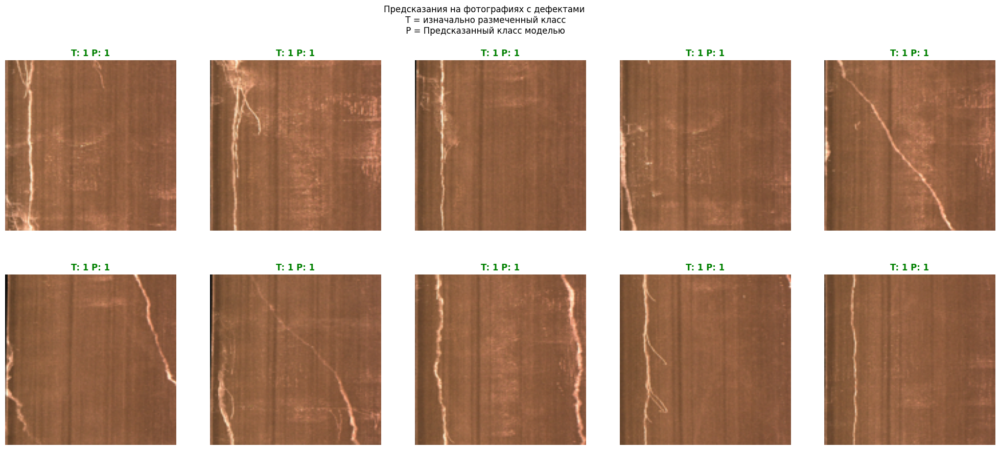

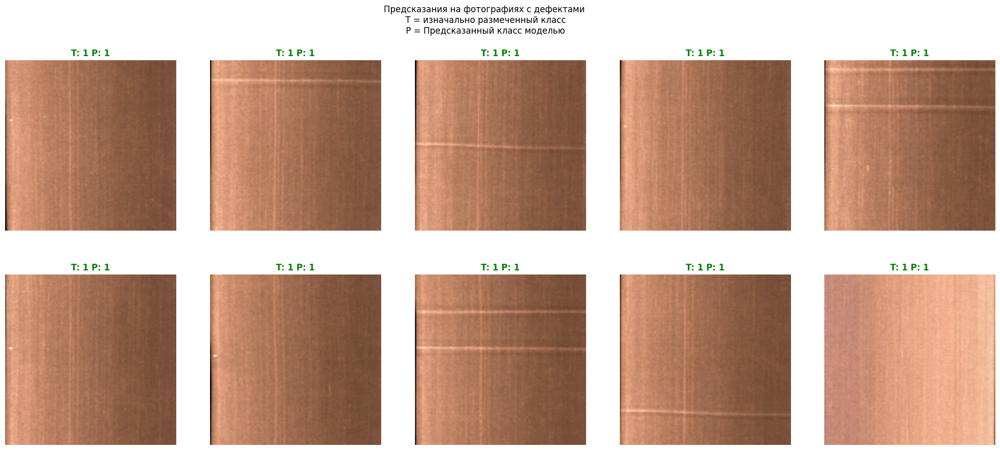

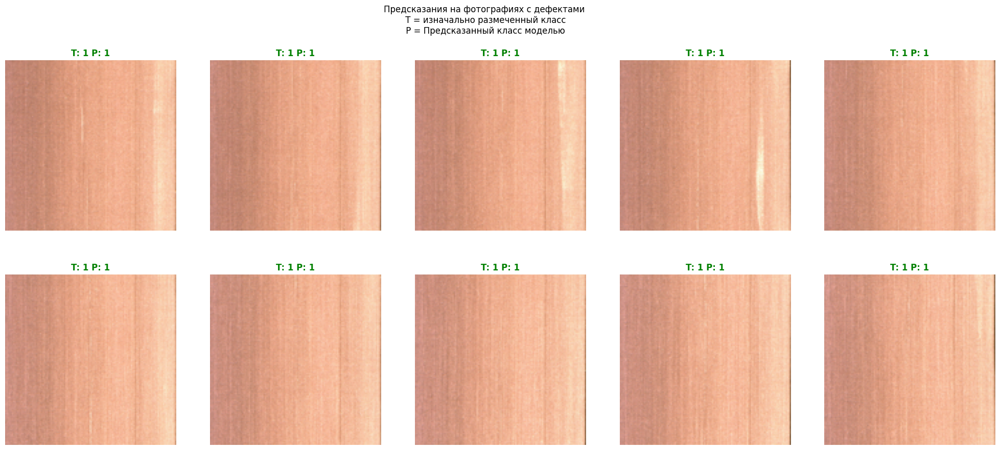

In [36]:
periods = [(0, 10), (20, 30), (35,45), (50, 60), (70, 80)]

for start, stop in periods:
    fig = plt.figure(figsize=(25, 10))
    fig.suptitle("Предсказания на фотографиях с дефектами\n T = изначально размеченный класс\n P = Предсказанный класс моделью", )
    for i in range(start, stop):
        img = images_test[i]
        ax = fig.add_subplot(2, 5, i + 1 - start) 
        ax.set_axis_off()
        ax.set_title(f"T: {labels_test[i]} P: {y_pred[i]}", fontdict={'color': 'green' if labels_test[i] == y_pred[i] else 'red', 'fontweight': 'bold'}, ) 
        ax.imshow(img)
    plt.show()




#### **NORMALS** ####

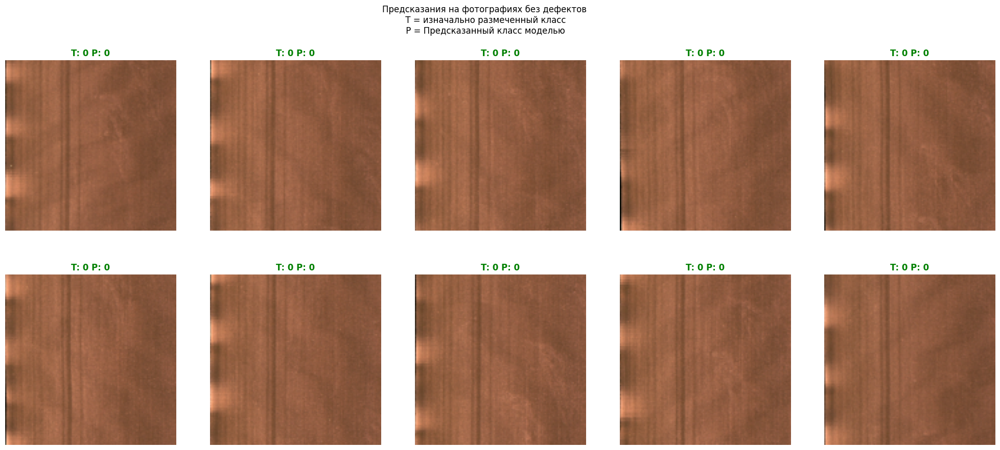

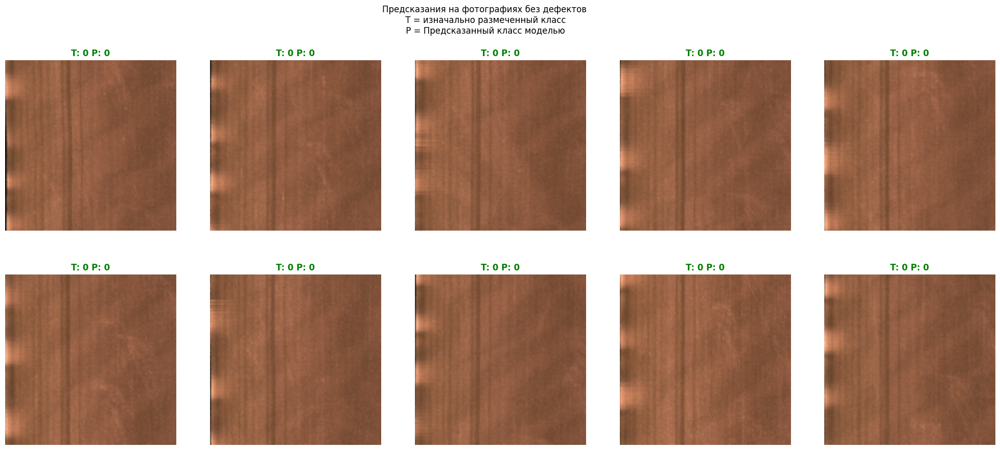

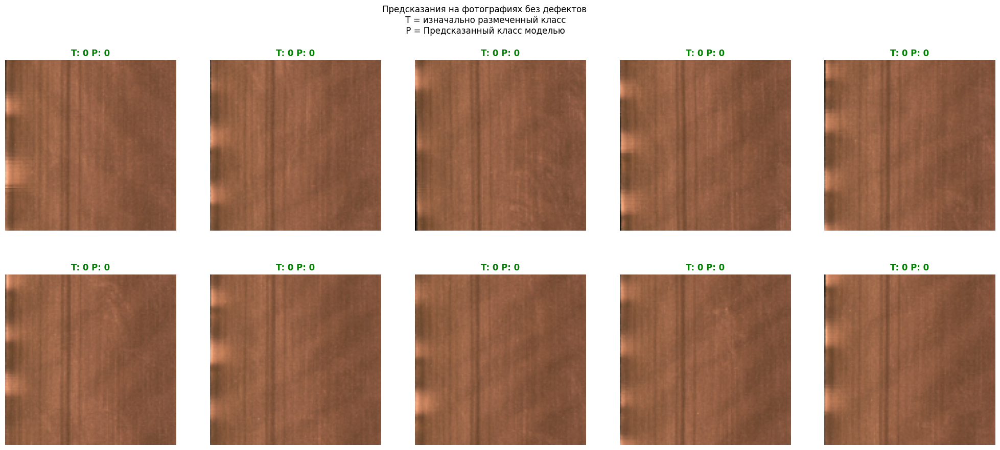

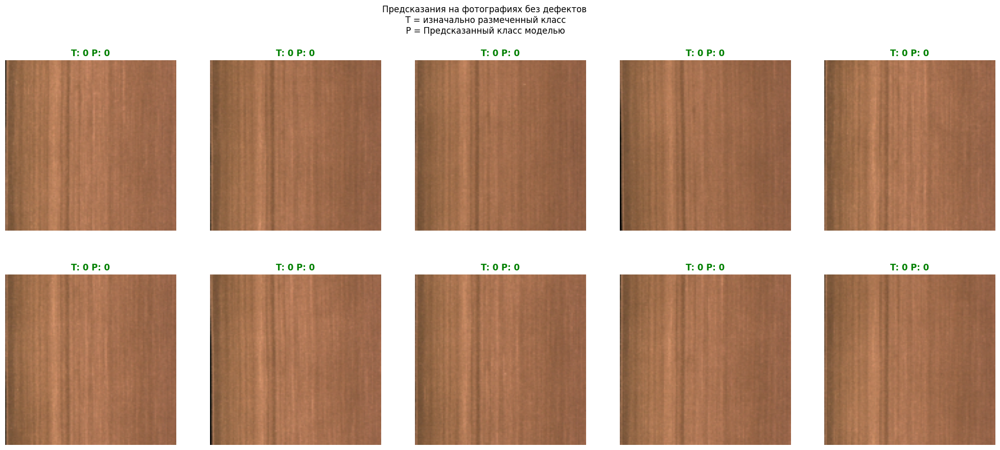

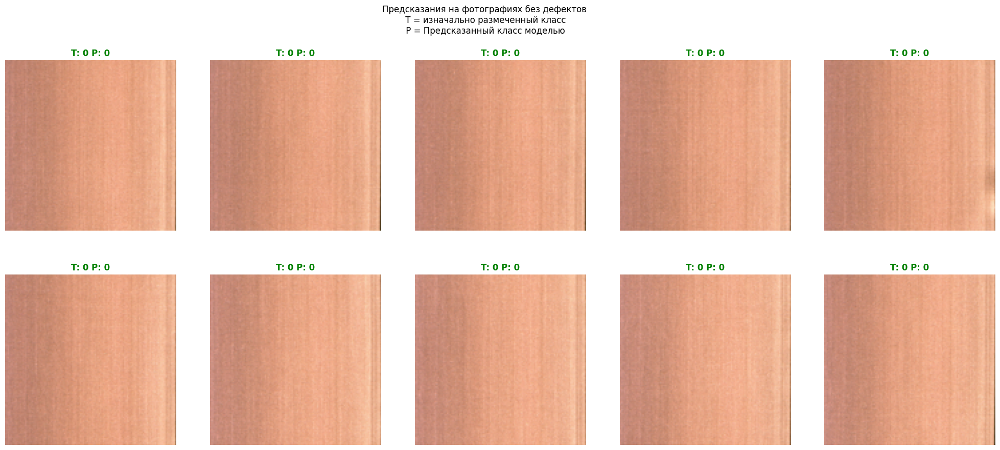

In [37]:
periods = [(0, 10), (20, 30), (35,45), (50, 60), (70, 80)]

for start, stop in periods:
    fig = plt.figure(figsize=(25, 10))
    fig.suptitle("Предсказания на фотографиях без дефектов\n T = изначально размеченный класс\n P = Предсказанный класс моделью", )

    for i in range(start, stop):
        img = images_test[i+100]
        ax = fig.add_subplot(2, 5, i + 1 - start) 
        ax.set_axis_off()
        ax.set_title(f"T: {labels_test[i+100]} P: {y_pred[i+100]}", fontdict={'color': 'green' if labels_test[i+100] == y_pred[i+100] else 'red', 'fontweight': 'bold'}, ) 
        ax.imshow(img)
    plt.show()
